C:\Users\takat\AppData\Local\Temp\ipykernel_40036\4073199059.py:12: RuntimeWarning: divide by zero encountered in log
  d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))


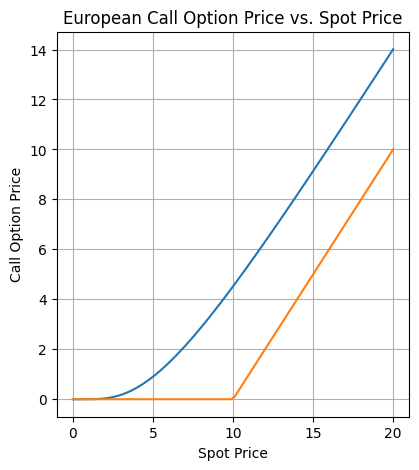

In [1]:
import math
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import time
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset


def calculate_european_call_price(S, K, T, r, sigma):
    d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)

    call_price = S * norm_cdf(d1) - K * np.exp(-r * T) * norm_cdf(d2)
    return call_price

def norm_cdf(x):
    return (1 + math.erf(x / math.sqrt(2))) / 2

def calculate_payout(S, K):
    return np.maximum(S - K, 0)


spot_prices = np.linspace(0, 20, 100)

# Set the option parameters
K = 10  # Strike price
T = 10  # Time to expiration in years
r = 0.05  # Risk-free interest rate
sigma = 0.2  # Volatility

# Calculate the call option prices for the spot prices
call_prices = [calculate_european_call_price(i, K, T, r, sigma) for i in spot_prices]

payouts = calculate_payout(spot_prices, K)

# Plot the call option price and the payout
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.plot(spot_prices, call_prices)
plt.plot(spot_prices, payouts)

plt.xlabel('Spot Price')
plt.ylabel('Call Option Price')
plt.title('European Call Option Price vs. Spot Price')
plt.grid(True)
plt.show()

In [2]:
##### import numpy as np

def generate_training_data(num_samples, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range):
    min_spot_price, max_spot_price = spot_price_range
    min_strike_price, max_strike_price = strike_price_range
    min_expiry, max_expiry = expiration_range
    min_rate, max_rate = interest_rate_range
    min_volatility, max_volatility = volatility_range

    # Generate random values within the specified ranges
    spot_prices = np.random.uniform(min_spot_price, max_spot_price, num_samples)
    strike_prices = np.random.uniform(min_strike_price, max_strike_price, num_samples)
    expirations = np.random.uniform(min_expiry, max_expiry, num_samples)
    interest_rates = np.random.uniform(min_rate, max_rate, num_samples)
    volatilities = np.random.uniform(min_volatility, max_volatility, num_samples)

    # Calculate the call option prices for the generated values
    call_prices = [calculate_european_call_price(spot_prices[i], strike_prices[i], expirations[i], interest_rates[i], volatilities[i]) for i in range(num_samples)]

    # Combine the input features into a single array
    X = np.column_stack((spot_prices, strike_prices, expirations, interest_rates, volatilities))

    return X,  np.array(call_prices).reshape(-1,1)

def generate_training_data_bd1(num_samples, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range):
    min_spot_price, max_spot_price = spot_price_range
    min_strike_price, max_strike_price = strike_price_range
    min_expiry, max_expiry = expiration_range
    min_rate, max_rate = interest_rate_range
    min_volatility, max_volatility = volatility_range

    # Generate random values within the specified ranges
    spot_prices = np.random.uniform(min_spot_price, max_spot_price, num_samples)
    strike_prices = np.random.uniform(min_strike_price, max_strike_price, num_samples)
    expirations = np.zeros(num_samples)
    interest_rates = np.random.uniform(min_rate, max_rate, num_samples)
    volatilities = np.random.uniform(min_volatility, max_volatility, num_samples)
    call_prices = [max(spot_prices[i]- strike_prices[i],0) for i in range(num_samples)]

    # Combine the input features into a single array
    X = np.column_stack((spot_prices, strike_prices, expirations, interest_rates, volatilities))

    return X, np.array(call_prices).reshape(-1,1)

def generate_training_data_bd2(num_samples, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range):
    min_spot_price, max_spot_price = spot_price_range
    min_strike_price, max_strike_price = strike_price_range
    min_expiry, max_expiry = expiration_range
    min_rate, max_rate = interest_rate_range
    min_volatility, max_volatility = volatility_range

    # Generate random values within the specified ranges
    spot_prices = np.random.uniform(0, 0.1, num_samples)
    strike_prices = np.random.uniform(min_strike_price, max_strike_price, num_samples)
    expirations = np.random.uniform(min_expiry, max_expiry, num_samples)
    interest_rates = np.random.uniform(min_rate, max_rate, num_samples)
    volatilities = np.random.uniform(min_volatility, max_volatility, num_samples)

    # Calculate the call option prices for the generated values
    call_prices = [0 for i in range(num_samples)]

    # Combine the input features into a single array
    X = np.column_stack((spot_prices, strike_prices, expirations, interest_rates, volatilities))

    return X, np.array(call_prices).reshape(-1,1)

def generate_training_data_bd3(num_samples, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range):
    min_spot_price, max_spot_price = spot_price_range
    min_strike_price, max_strike_price = strike_price_range
    min_expiry, max_expiry = expiration_range
    min_rate, max_rate = interest_rate_range
    min_volatility, max_volatility = volatility_range

    # Generate random values within the specified ranges
    spot_prices = np.random.uniform(15, 20, num_samples)
    strike_prices = np.random.uniform(min_strike_price, max_strike_price, num_samples)
    expirations = np.random.uniform(min_expiry, max_expiry, num_samples)
    interest_rates = np.random.uniform(min_rate, max_rate, num_samples)
    volatilities = np.random.uniform(min_volatility, max_volatility, num_samples)

    call_prices_ = [calculate_european_call_price(spot_prices[i], strike_prices[i], expirations[i], interest_rates[i], volatilities[i]) for i in range(num_samples)]
    call_prices = [max(spot_prices[i]- strike_prices[i]*np.exp(-expirations[i]*interest_rates[i]),0) for i in range(num_samples)]
    # print(call_prices_)
    # print(call_prices)
    # Combine the input features into a single array
    X = np.column_stack((spot_prices, strike_prices, expirations, interest_rates, volatilities))

    return X, np.array(call_prices).reshape(-1,1)

num_samples = 60000

# Set the ranges for each parameter


spot_price_range = (1, 20)
strike_price_range = (5, 5)
expiration_range = (0.1, 10)
interest_rate_range = (0.005, 0.1)
volatility_range = (0.001, 0.2)
# Generate the training data
X_train, Y_train = generate_training_data(num_samples, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)
X_test, Y_test = generate_training_data(num_samples, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)
X_train_bd1, Y_train_bd1 = generate_training_data_bd1(num_samples, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)
X_train_bd2, Y_train_bd2 = generate_training_data_bd2(num_samples, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)
X_train_bd3, Y_train_bd3 = generate_training_data_bd3(num_samples, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)


In [3]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

scaler = StandardScaler()
scaler_y = StandardScaler()

# scaler_y = MinMaxScaler()

scaler.fit(X_train)
scaler_y.fit(np.array(Y_train).reshape(-1,1))
X_train = X_train
Y_train = np.array(Y_train).reshape(-1,1)
X_test = X_test
Y_test = np.array(Y_test).reshape(-1,1)

In [4]:
scaler.scale_[0]*=5
scaler.scale_
scaler_y.scale_[0]*=5

In [5]:
import torch.nn.functional as F
import torch
import torch.nn as nn
import torch.optim as optim
class Net(nn.Module):
    def __init__(self, input_size):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(input_size, 512)
        self.fc2 = nn.Linear(512, 512)
        self.fc3 = nn.Linear(512, 512)
        self.fc4 = nn.Linear(512, 32)
        self.fc5 = nn.Linear(32, 1)


    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = F.relu(self.fc4(x))
        x = self.fc5(x)
        return x

class ResNetDeep(nn.Module):
    def __init__(self, input_size, width, depth=4):
        super(ResNetDeep, self).__init__()
        self.fc1 = nn.Linear(input_size, width)
        self.layers = nn.ModuleList()
        for _ in range(depth):
            self.layers.append(nn.ModuleList([nn.Linear(width, width) for _ in range(2)]))
        self.fc5 = nn.Linear(width, 1)

    def forward(self, x):
        res = F.relu(self.fc1(x))
        for layer_pair in self.layers:
            x = F.relu(layer_pair[0](res))
            x = F.relu(layer_pair[1](x))
            res = res + x
        return self.fc5(res)

class SinNet(nn.Module):
    def __init__(self, input_size):
        super(SinNet, self).__init__()
        self.sin = nn.Linear(input_size, 604)
        self.cos = nn.Linear(input_size, 64)
        self.fc1 = nn.Linear(128, 64)
        self.fc2 = nn.Linear(64, 64)
        self.fc3 = nn.Linear(64, 1)

    def forward(self, x):
        sin = torch.sin(self.sin(x))
        cos = torch.cos(self.cos(x))
        x = torch.cat((sin, cos), dim=1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

input_size = 5  # Corrected input size based on the number of features
model = Net(input_size)

In [6]:

class DGMCell(nn.Module):
  def __init__(self, input_dim, hidden_dim, n_layers=3, output_dim=1):
    super(DGMCell, self).__init__()
    self.input_dim = input_dim
    self.hidden_dim = hidden_dim
    self.output_dim = output_dim
    self.n = n_layers

    self.sig_act = nn.Tanh()

    self.Sw = nn.Linear(self.input_dim, self.hidden_dim)

    self.Uz = nn.Linear(self.input_dim, self.hidden_dim)
    self.Wsz = nn.Linear(self.hidden_dim, self.hidden_dim)

    self.Ug = nn.Linear(self.input_dim, self.hidden_dim)
    self.Wsg = nn.Linear(self.hidden_dim, self.hidden_dim)

    self.Ur = nn.Linear(self.input_dim, self.hidden_dim)
    self.Wsr = nn.Linear(self.hidden_dim, self.hidden_dim)

    self.Uh = nn.Linear(self.input_dim, self.hidden_dim)
    self.Wsh = nn.Linear(self.hidden_dim, self.hidden_dim)

    self.Wf = nn.Linear(hidden_dim, output_dim)


  def forward(self, x):
    S1 = self.Sw(x)
    for i in range(self.n):
      if i==0:
        S = S1
      else:
        S = self.sig_act(out)
      Z = self.sig_act(self.Uz(x) + self.Wsz(S))
      G = self.sig_act(self.Ug(x) + self.Wsg(S1))
      R = self.sig_act(self.Ur(x) + self.Wsr(S))
      H = self.sig_act(self.Uh(x) + self.Wsh(S*R))
      out = (1-G)*H + Z*S
    out = self.Wf(out)
    return out

# model = DGMCell(5, 256, 3, 1)

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
scaler_x_tensor_means = torch.Tensor(scaler.mean_).to(device)
scaler_x_tensor_stds = torch.Tensor(scaler.scale_).to(device)
# scaler_y_max =torch.Tensor(scaler_y.data_max_).to(device)
scaler_y_tensor_means = torch.Tensor(scaler_y.mean_).to(device)
scaler_y_tensor_stds = torch.Tensor(scaler_y.scale_).to(device)
X_test, y_test = generate_training_data(1000, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)
    
X_test_tensor = torch.Tensor(X_test).to(device)
y_test_tensor = torch.Tensor(y_test).to(device)

In [8]:
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau

def train_model(net,model_width=16, model_depth=3, epochs=10, sample_size=1000, batch_size=100, 
                lr_start=0.003, mode="pde-mse-stiff", weight_decay_adam=0, logging=True,
                n_domains=10, step_size = 1000, gamma=0.5, denom = 1000, padding = 0.2, advanced = True):
    
    # net = DGMCell(5, model_width, model_depth, 1)
    grads = []
    criterion = nn.MSELoss()
    net.to(device)

    optimizer = optim.Adam(net.parameters(), lr=lr_start, weight_decay=weight_decay_adam, betas=(0.9,0.999))
    scheduler = StepLR(optimizer, step_size=step_size, gamma=gamma)
    # scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=20, verbose=True)
    

    X_train, Y_train = generate_training_data(sample_size, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)
    X_train_bd1, Y_train_bd1 = generate_training_data_bd1(sample_size, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)
    X_train_bd2, Y_train_bd2 = generate_training_data_bd2(sample_size, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)
    X_train_bd3, Y_train_bd3 = generate_training_data_bd3(sample_size, (100,300), strike_price_range, expiration_range, interest_rate_range, volatility_range)

    X_train_tensor_ = torch.Tensor(X_train).to(device)
    Y_train_tensor_ = torch.Tensor(Y_train).to(device)
    X_train_tensor_bd1_ = torch.Tensor(X_train_bd1).to(device)
    Y_train_tensor_bd1_ = torch.Tensor(Y_train_bd1).to(device)
    X_train_tensor_bd2_ = torch.Tensor(X_train_bd2).to(device)
    Y_train_tensor_bd2_ = torch.Tensor(Y_train_bd2).to(device)
    X_train_tensor_bd3_ = torch.Tensor(X_train_bd3).to(device)
    Y_train_tensor_bd3_ = torch.Tensor(Y_train_bd3).to(device)

    lambda_decay = 0.99
    lambda_pde = 1
    lambda_bd1 = 1
    lambda_bd2 = 1
    lambda_bd3 = 1
    alpha = 0.5
    monitoring = {
        "loss_train" : [],
        "loss_test" : [],
        "loss_bd1" : [],
        "loss_bd2" : [],
        "loss_bd3" : [],
        "loss_pde" : [],
        "bd1_l1_list" : [],
        "bd2_l1_list" : [],
        "bd3_l1_list" : [],
        "pde_l1_list" : [],
        "bd1_l1_list_" : [],
        "bd2_l1_list_" : [],
        "bd3_l1_list_" : [],
        "pde_l1_list_" : [],
    }
    counter = 0
    for j in range(epochs):
        # X_train, Y_train = generate_training_data(sample_size, (0,300), strike_price_range, expiration_range, interest_rate_range, volatility_range)
        X_train_bd1, Y_train_bd1 = generate_training_data_bd1(sample_size, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)
        X_train_bd2, Y_train_bd2 = generate_training_data_bd2(sample_size, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)
        X_train_bd3, Y_train_bd3 = generate_training_data_bd3(sample_size, (100,300), strike_price_range, expiration_range, interest_rate_range, volatility_range)

        X_train_tensor_ = torch.Tensor(X_train).to(device)
        Y_train_tensor_ = torch.Tensor(Y_train).to(device)
        X_train_tensor_bd1_ = torch.Tensor(X_train_bd1).to(device)
        Y_train_tensor_bd1_ = torch.Tensor(Y_train_bd1).to(device)
        X_train_tensor_bd2_ = torch.Tensor(X_train_bd2).to(device)
        Y_train_tensor_bd2_ = torch.Tensor(Y_train_bd2).to(device)
        X_train_tensor_bd3_ = torch.Tensor(X_train_bd3).to(device)
        Y_train_tensor_bd3_ = torch.Tensor(Y_train_bd3).to(device)
        begin = time.time()
        for i in range(0, sample_size, batch_size):
            # X_train_tensor = X_train_tensor_[i:i+batch_size]
            # Y_train_tensor = Y_train_tensor_[i:i+batch_size]
            X_train_tensor_bd1 = X_train_tensor_bd1_[i:i+batch_size]
            Y_train_tensor_bd1 = Y_train_tensor_bd1_[i:i+batch_size]
            X_train_tensor_bd2 = X_train_tensor_bd2_[i:i+batch_size]
            Y_train_tensor_bd2 = Y_train_tensor_bd2_[i:i+batch_size]
            X_train_tensor_bd3 = X_train_tensor_bd3_[i:i+batch_size]
            Y_train_tensor_bd3 = Y_train_tensor_bd3_[i:i+batch_size]
            
            optimizer.zero_grad(set_to_none=True)
            pde_density_scaler = 1
            sample_per_domain = batch_size//n_domains
            step_per_domain = 10/n_domains
            pde_sample_count = sample_per_domain*pde_density_scaler
            pde_domain_losses = torch.zeros(n_domains).to(device)
            outputs_scaled_pde = torch.zeros(batch_size*pde_density_scaler).to(device)
            for domain in range(n_domains):
               
                domain_end = 10-(domain*step_per_domain)
                domain_begin = 10-((domain+1)*step_per_domain)
                # domain_begin = domain*step_per_domain+padding
                # domain_end = (domain+1)*step_per_domain+padding
                X_train, Y_train = generate_training_data(pde_sample_count,spot_price_range, strike_price_range, (domain_begin, domain_end), interest_rate_range, volatility_range)
                X_train_tensor = torch.Tensor(X_train).to(device)
                Y_train_tensor = torch.Tensor(Y_train).to(device)

                X_train_tensor.requires_grad_ = True
                X_train_tensor.requires_grad = True
                X_train_tensor_bd2.requires_grad = True
                
                
                s_ = X_train_tensor[:,0]
                k_ = X_train_tensor[:,1]
                t_ = X_train_tensor[:,2]
                r_ = X_train_tensor[:,3]
                sigma_ = X_train_tensor[:,4]
                
                stack = torch.stack([s_, k_,t_, r_, sigma_], axis=1)

                nn_input = (stack-scaler_x_tensor_means)/scaler_x_tensor_stds
                
                outputs_unscaled = net(nn_input)
                outputs = outputs_unscaled * scaler_y_tensor_stds + scaler_y_tensor_means
                dVdt = torch.autograd.grad(outputs, t_, grad_outputs=torch.ones_like(outputs), create_graph=True, retain_graph=True)[0]
                dVdS = torch.autograd.grad(outputs, s_, grad_outputs=torch.ones_like(outputs), create_graph=True,retain_graph=True)[0]
                d2Vd2S = torch.autograd.grad(dVdS, s_, grad_outputs=torch.ones_like(dVdS), create_graph=True,retain_graph=True)[0]
                outputs_scaled_pde_domain = (dVdt+ 0.5*(sigma_**2)*(s_**2)*d2Vd2S + r_*s_*dVdS - r_*outputs.view(-1))**2
                loss_pde_ = torch.mean(outputs_scaled_pde_domain)
                # loss_delta_0 = torch.mean(F.relu(-dVdS)**2)
                # loss_delta_1 = torch.mean(F.relu((dVdS-1))**2)
                # loss_time = torch.mean(F.relu(-dVdt)**2)
                # loss_conv = torch.mean(F.relu(-d2Vd2S)**2)
                # # outputs_scaled_mse = (Y_train_tensor-outputs)**2
                # loss_mse = criterion(Y_train_tensor,outputs)
                pde_domain_losses[domain] = loss_pde_
                outputs_scaled_pde[domain*pde_sample_count:(domain+1)*pde_sample_count] = outputs_scaled_pde_domain
            epsilon = 1
            domain_weights = torch.exp(-torch.cumsum(pde_domain_losses, dim=0)*epsilon)
            domain_weights[1:] = domain_weights[:-1].clone()
            domain_weights[0] = 1
            domain_weights = domain_weights.detach()
            loss_pde = torch.mean(domain_weights*pde_domain_losses)
            loss_pde_conventional = torch.mean(pde_domain_losses)

            
            
            nn_input_bd1 = (X_train_tensor_bd1-scaler_x_tensor_means)/scaler_x_tensor_stds
            outputs_unscaled_bd1 = net(nn_input_bd1)
            outputs_scaled_bd1 = outputs_unscaled_bd1*scaler_y_tensor_stds+scaler_y_tensor_means
            
            # outputs_scaled_bd1 = outputs_unscaled_bd1*scaler_y_max
            loss_bd1 = criterion(outputs_scaled_bd1, Y_train_tensor_bd1)

            s_2 = X_train_tensor_bd2[:,0]
            k_2 = X_train_tensor_bd2[:,1]
            t_2 = X_train_tensor_bd2[:,2]
            r_2 = X_train_tensor_bd2[:,3]
            sigma_2 = X_train_tensor_bd2[:,4]
            
            stack_2 = torch.stack([s_2, k_2,t_2, r_2, sigma_2], axis=1)

            nn_input_bd2 = (stack_2-scaler_x_tensor_means)/scaler_x_tensor_stds
            outputs_unscaled_bd2 = net(nn_input_bd2)
            outputs_scaled_bd2 = outputs_unscaled_bd2*scaler_y_tensor_stds+scaler_y_tensor_means
            
            # outputs_scaled_bd2 = outputs_unscaled_bd2*scaler_y_max
            loss_bd2 = criterion(outputs_scaled_bd2, Y_train_tensor_bd2)
            dVdS_2 = torch.autograd.grad(outputs_scaled_bd2, s_2, grad_outputs=torch.ones_like(outputs_scaled_bd2), create_graph=True,retain_graph=True)[0]
            loss_bd2_pde = torch.mean(dVdS_2**2)
            
            nn_input_bd3 = (X_train_tensor_bd3-scaler_x_tensor_means)/scaler_x_tensor_stds
            outputs_unscaled_bd3 = net(nn_input_bd3)
            outputs_scaled_bd3 = outputs_unscaled_bd3*scaler_y_tensor_stds+scaler_y_tensor_means
            # outputs_scaled_bd3 = outputs_unscaled_bd3*scaler_y_max
            loss_bd3 = criterion(outputs_scaled_bd3, Y_train_tensor_bd3)
        

            sum_loss = loss_bd1.item()+loss_bd2.item()+loss_bd3.item()+loss_pde_conventional.item()

            monitoring["loss_train"].append(sum_loss)
            monitoring["loss_bd1"].append(loss_bd1.item())
            monitoring["loss_bd2"].append(loss_bd2.item())
            monitoring["loss_bd3"].append(loss_bd3.item())
            monitoring["loss_pde"].append(loss_pde_conventional.item())



            if j%1001==0:
                print(f"BD1 loss: {loss_bd1.item()}")
                print(f"BD2 loss: {loss_bd2.item()}")
                print(f"BD3 loss: {loss_bd3.item()}")
                print(f"PDE loss: {loss_pde_conventional.item()}")
                print(f"Sum of losses: {sum_loss}")

                concat = torch.cat([torch.autograd.grad(loss_pde, p, retain_graph=True)[0].flatten() for p in net.parameters()], dim=0)
                pde_l2 = torch.linalg.norm(concat, ord=2).detach().item()
                
                concat = torch.cat([torch.autograd.grad(loss_bd1, p, retain_graph=True)[0].flatten() for p in net.parameters()], dim=0)
                bd1_l2 = torch.linalg.norm(concat, ord=2).detach().item()

                concat = torch.cat([torch.autograd.grad(loss_bd2, p, retain_graph=True)[0].flatten() for p in net.parameters()], dim=0)
                bd2_l2 = torch.linalg.norm(concat, ord=2).detach().item()

                concat = torch.cat([torch.autograd.grad(loss_bd3, p, retain_graph=True)[0].flatten() for p in net.parameters()], dim=0)
                bd3_l2 = torch.linalg.norm(concat, ord=2).detach().item()

                monitoring["bd1_l1_list"].append(bd1_l2)
                monitoring["bd2_l1_list"].append(bd2_l2)
                monitoring["bd3_l1_list"].append(bd3_l2)
                monitoring["pde_l1_list"].append(pde_l2)

                lambda_pde_current = (pde_l2 + bd1_l2 + bd2_l2 + bd3_l2)/(pde_l2+1e-8)
                lambda_bd1_current = (pde_l2 + bd1_l2 + bd2_l2 + bd3_l2)/(bd1_l2+1e-8)
                lambda_bd2_current = (pde_l2 + bd1_l2 + bd2_l2 + bd3_l2)/(bd2_l2+1e-8)
                lambda_bd3_current = (pde_l2 + bd1_l2 + bd2_l2 + bd3_l2)/(bd3_l2+1e-8)
                # print all lambdas in a line 
                print(f"lambda pde: {lambda_pde_current}, lambda bd1: {lambda_bd1_current}, lambda bd2: {lambda_bd2_current}, lambda bd3: {lambda_bd3_current}")
                print(f"pde_l2: {pde_l2}, bd1_l2: {bd1_l2}, bd2_l2: {bd2_l2}, bd3_l2: {bd3_l2}")
                print(pde_domain_losses.cpu())
                print(torch.cumsum(pde_domain_losses, dim=0).cpu())
                print(domain_weights.cpu())


                lambda_pde = (1-alpha)*lambda_pde + alpha*lambda_pde_current
                lambda_bd1 = (1-alpha)*lambda_bd1 + alpha*lambda_bd1_current
                lambda_bd2 = (1-alpha)*lambda_bd2 + alpha*lambda_bd2_current
                lambda_bd3 = (1-alpha)*lambda_bd3 + alpha*lambda_bd3_current

        
        
            correction_bd1 =  (denom/(j+denom+1))*40 + 1
            correction_bd2 = (denom/(j+denom+1))*10+ 1
            correction_bd3 = (denom/(j+denom+1))*80 + 1
            # correction_bd1 = 1
            # correction_bd2 =  1
            # correction_bd3 =  1
            if advanced:
                loss_pde = loss_pde*lambda_pde
                loss_bd1 = loss_bd1*lambda_bd1*correction_bd1
                loss_bd2 = loss_bd2*lambda_bd2*correction_bd2
                loss_bd3 = loss_bd3*lambda_bd3*correction_bd3
            loss = loss_pde + loss_bd1 + loss_bd2 + loss_bd3
            counter += 1

            # loss = loss_pde*lambda_pde + loss_bd1*lambda_bd1 + loss_bd2*lambda_bd2 + loss_bd3*lambda_bd3
            if j%1000==0:
                
                concat = torch.cat([torch.autograd.grad(loss_pde, p, retain_graph=True)[0].flatten() for p in net.parameters()], dim=0)
                pde_l2 = torch.linalg.norm(concat, ord=2).detach().item()
                
                concat = torch.cat([torch.autograd.grad(loss_bd1, p, retain_graph=True)[0].flatten() for p in net.parameters()], dim=0)
                bd1_l2 = torch.linalg.norm(concat, ord=2).detach().item()

                concat = torch.cat([torch.autograd.grad(loss_bd2, p, retain_graph=True)[0].flatten() for p in net.parameters()], dim=0)
                bd2_l2 = torch.linalg.norm(concat, ord=2).detach().item()

                concat = torch.cat([torch.autograd.grad(loss_bd3, p, retain_graph=True)[0].flatten() for p in net.parameters()], dim=0)
                bd3_l2 = torch.linalg.norm(concat, ord=2).detach().item()

                monitoring["bd1_l1_list_"].append(bd1_l2)
                monitoring["bd2_l1_list_"].append(bd2_l2)
                monitoring["bd3_l1_list_"].append(bd3_l2)
                monitoring["pde_l1_list_"].append(pde_l2)
            
                print("------------------------------------------")
                print(f"pde_l2: {pde_l2}, bd1_l2: {bd1_l2}, bd2_l2: {bd2_l2}, bd3_l2: {bd3_l2}")
                print("------------------------------------------")

            if j == epochs-1 and i == 0:
                loss_pde.backward(retain_graph=True)
                grads.append([p.grad.cpu().numpy().flatten() for p in net.parameters() if p.shape.__len__() > 1])
                optimizer.zero_grad(set_to_none=True)

                loss_bd1.backward(retain_graph=True)
                grads.append([p.grad.cpu().numpy().flatten() for p in net.parameters() if p.shape.__len__() > 1])
                optimizer.zero_grad(set_to_none=True)

                loss_bd2.backward(retain_graph=True)
                grads.append([p.grad.cpu().numpy().flatten() for p in net.parameters() if p.shape.__len__() > 1])
                optimizer.zero_grad(set_to_none=True)

                loss_bd3.backward()
                grads.append([p.grad.cpu().numpy().flatten() for p in net.parameters() if p.shape.__len__() > 1])
                optimizer.zero_grad(set_to_none=True)
               

            else:
                optimizer.zero_grad(set_to_none=True)
                loss.backward()
                optimizer.step()

        X_test_tensor_ = (X_test_tensor-scaler_x_tensor_means)/scaler_x_tensor_stds
        test_outputs = net(X_test_tensor_)
        test_outputs = test_outputs * scaler_y_tensor_stds + scaler_y_tensor_means
        # test_outputs = test_outputs * scaler_y_max

        test_loss = criterion(test_outputs, y_test_tensor)
        
        monitoring["loss_test"].append(test_loss.item())
        # if j < 15000:
        
        scheduler.step()
        # scheduler.step(sum_loss)
        
        if logging:
            
            print(f"Epoch {j}/{epochs}, Train Loss: {loss.item():.4f}, Test Loss: {test_loss.item():.4f}")
            end = time.time()
            print(f"Excecution took: {end-begin}")
    return {
        "monitoring":monitoring,
        "grads":grads,
        "net": net}

In [9]:
net = ResNetDeep(5,16,depth=6)

In [13]:
copied_model = ResNetDeep(5,16,depth=6)

copied_model.load_state_dict(net.state_dict())

data = train_model(copied_model,epochs=10000, lr_start=0.001, logging=True,
                    sample_size=512, batch_size=512, denom=5000,
                    step_size=1000, gamma=0.4, n_domains=1,
                    padding=0.1,advanced=False)

BD1 loss: 31.403005599975586
BD2 loss: 65.35777282714844
BD3 loss: 102.3637466430664
PDE loss: 1.8036181926727295
Sum of losses: 200.92814326286316
lambda pde: 209.18650725192163, lambda bd1: 33.028599837570106, lambda bd2: 2.466933560099194, lambda bd3: 1.787050613025957
pde_l2: 15.421893119812012, bd1_l2: 97.67449951171875, bd2_l2: 1307.7174072265625, bd3_l2: 1805.2381591796875
tensor([1.8036], grad_fn=<CopySlices>)
tensor([1.8036], grad_fn=<CumsumBackward0>)
tensor([1.])
------------------------------------------
pde_l2: 15.421893119812012, bd1_l2: 97.67449951171875, bd2_l2: 1307.7174072265625, bd3_l2: 1805.2381591796875
------------------------------------------
Epoch 0/10000, Train Loss: 200.9281, Test Loss: 46.5957
Excecution took: 0.37615251541137695
Epoch 1/10000, Train Loss: 184.8720, Test Loss: 44.7140
Excecution took: 0.06240224838256836
Epoch 2/10000, Train Loss: 179.7574, Test Loss: 43.1642
Excecution took: 0.04119706153869629
Epoch 3/10000, Train Loss: 181.4443, Test Loss

In [ ]:
copied_model = ResNetDeep(5,32,depth=12)

copied_model.load_state_dict(net.state_dict())

data = train_model(copied_model,epochs=10000, lr_start=0.001, logging=True,
                    sample_size=512, batch_size=512, denom=5000,
                    step_size=1000, gamma=0.4, n_domains=1,
                    padding=0.1,advanced=True)

BD1 loss: 57.739097595214844
BD2 loss: 9.88786506652832
BD3 loss: 206.05133056640625
PDE loss: 0.21883609890937805
Sum of losses: 273.8971293270588
lambda pde: 1223.8673997039566, lambda bd1: 3.8540170149277433, lambda bd2: 22.42832305168726, lambda bd3: 1.4385862438630699
pde_l2: 2.688192844390869, bd1_l2: 853.652587890625, bd2_l2: 146.68914794921875, bd3_l2: 2286.961669921875
tensor([0.2188], grad_fn=<CopySlices>)
tensor([0.2188], grad_fn=<CumsumBackward0>)
tensor([1.])
------------------------------------------
pde_l2: 2.688192844390869, bd1_l2: 853.652587890625, bd2_l2: 146.68914794921875, bd3_l2: 2286.961669921875
------------------------------------------
Epoch 0/10000, Train Loss: 273.8971, Test Loss: 43.8093
Excecution took: 0.7456836700439453
Epoch 1/10000, Train Loss: 163.0921, Test Loss: 49.2239
Excecution took: 0.04823946952819824
Epoch 2/10000, Train Loss: 181.6662, Test Loss: 33.9689
Excecution took: 0.038036346435546875
Epoch 3/10000, Train Loss: 133.5303, Test Loss: 24.

In [265]:
# data = train_model(data["net"],epochs=10000, lr_start=0.0001, logging=True,
#                     sample_size=1024, batch_size=1024, denom=200,
#                     step_size=4000, gamma=0.4, n_domains=1,
#                     padding=0.1)

In [14]:
import seaborn as sns
grads= data["grads"]   
losses = len(grads)

C:\Users\takat\AppData\Local\Temp\ipykernel_40036\2134320159.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('viridis', len(legend_titles))
c:\Users\takat\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\takat\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\takat\AppData\Local\Programs\Python\Python311\Lib\site-packages\

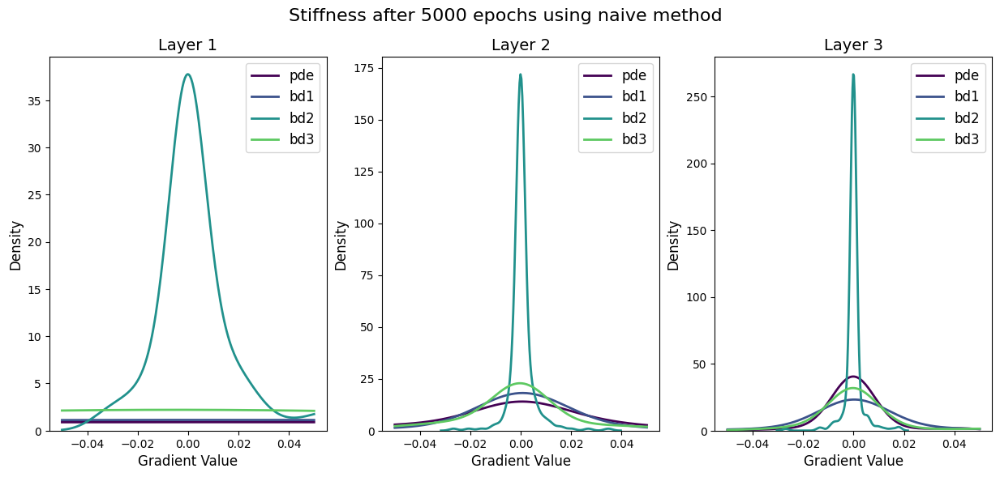

In [15]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 6))

# Legend titles
legend_titles = ["pde", "bd1", "bd2", "bd3", "mse"]

# Color map with viridis
color_map = plt.cm.get_cmap('viridis', len(legend_titles))

# Loop through each loss and layer to plot KDE
for loss in range(losses):
    for layer in range(3):
        sns.kdeplot(grads[loss][layer], ax=axes[layer], 
                    label=f"{legend_titles[loss]}", 
                    legend=True, 
                    clip=(-0.05,0.05), 
                    color=color_map(loss), 
                    linewidth=2)

        # Set title and font size for each subplot
        axes[layer].set_title(f"Layer {layer+1}", fontsize=14)

        # Set axis labels
        axes[layer].set_xlabel('Gradient Value', fontsize=12)
        axes[layer].set_ylabel('Density', fontsize=12)

        # Add legend with increased font size
        axes[layer].legend(fontsize=12)

# Add a super title for the entire figure
fig.suptitle(f"Stiffness after {5000} epochs using naive method", fontsize=16)

# Save the figure
# fig.savefig(f"graphs/naive-stiffness.png")

# Show the plot
plt.show()

In [16]:
data["grads"][0][0]

array([-2.4651650e-03,  0.0000000e+00, -4.2899765e-02,  5.5531734e-03,
        6.0476996e-03,  3.9435741e-02,  0.0000000e+00,  5.3724664e-01,
       -9.1643982e-02,  2.5825456e-02,  7.7580944e-02,  0.0000000e+00,
        1.0808172e+00, -1.6691831e-01,  2.0259967e-02, -7.0027667e-03,
        0.0000000e+00, -9.5368147e-02,  7.4757622e-03,  5.6585106e-03,
        3.9633317e-03,  0.0000000e+00,  4.3321781e-02, -9.3668038e-03,
        1.7168376e-03, -1.4623073e-03,  0.0000000e+00, -1.2783584e-02,
        3.4928550e-03, -4.5439601e-04,  3.8512577e-03,  0.0000000e+00,
        3.6982615e-02, -1.4446239e-02,  9.5150499e-03,  1.4470579e-02,
        0.0000000e+00,  1.7144309e-01, -4.2922128e-02,  1.2241207e-02,
       -6.4095715e-04,  0.0000000e+00, -2.4734170e-03,  3.4310340e-03,
       -3.1805534e-03,  2.9336015e-04,  0.0000000e+00,  3.8339074e-03,
       -1.5785146e-04, -6.7109015e-04,  5.8957517e-01,  0.0000000e+00,
        8.5738487e+00, -1.2016714e+00,  4.3389127e-02, -2.2344681e-04,
      

In [17]:
from matplotlib import cm


In [18]:
def plot_wrt_spot(net, T = 5):
    K = 5  # Strike price
    # T = 0.1  # Time to expiration in years
    r = 0.1  # Risk-free interest rate
    sigma = 0.1 # Volatility
    spot_prices = np.linspace(0,  10, 100)
    call_prices_actual = [calculate_european_call_price(i, K, T, r, sigma) for i in spot_prices]
    payouts_actual = calculate_payout(spot_prices, K)
    input_features = np.zeros((100, 5))
    input_features[:, 0] = spot_prices
    input_features[:, 1] = K
    input_features[:, 2] = T
    input_features[:, 3] = r
    input_features[:, 4] = sigma
    spot_prices_tensor = (torch.Tensor(input_features).reshape(-1, 5).to(device)-scaler_x_tensor_means)/scaler_x_tensor_stds
    with torch.no_grad():
        net.eval()
        call_prices_predicted = (net(spot_prices_tensor)* scaler_y_tensor_stds + scaler_y_tensor_means).cpu().numpy()

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(spot_prices, call_prices_actual, label='Actual', color=cm.viridis(0.1), linewidth=2)
    plt.plot(spot_prices, call_prices_predicted, label='Predicted', color=cm.viridis(0.5), linewidth=2)
    plt.plot(spot_prices, payouts_actual, label='Payout', color=cm.viridis(0.9), linewidth=2)

    # Add labels and title with increased font size
    plt.xlabel('Spot Price', fontsize=14)
    plt.ylabel('Call Option Price', fontsize=14)
    plt.title('European Call Option Price vs. Spot Price', fontsize=16)

    # Add a legend with increased font size
    plt.legend(fontsize=14)

    # Add grid for better readability of plot
    plt.grid(True)

    # Adjust layout to avoid clipping
    plt.tight_layout()

    # Show the plot
    plt.show()


C:\Users\takat\AppData\Local\Temp\ipykernel_40036\4073199059.py:12: RuntimeWarning: divide by zero encountered in log
  d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))


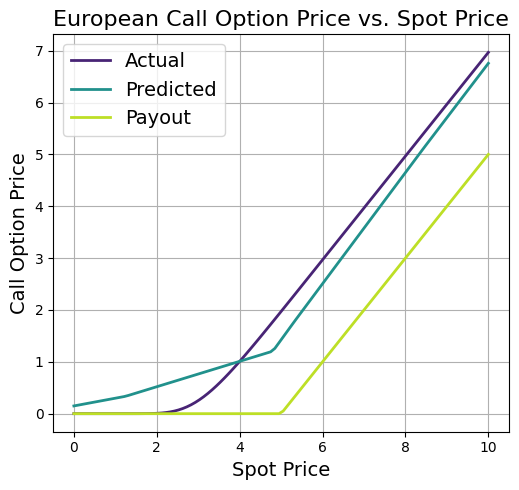

In [26]:
plot_wrt_spot(data["net"], T = 5)

In [20]:
def plot_wrt_time(net):
    S = 5
    K = 5  # Strike price
    T = 1 # Time to expiration in years
    r = 0.1  # Risk-free interest rate
    sigma = 0.1 # Volatility
    times = np.linspace(0.001,  10, 100)
    call_prices_actual = [calculate_european_call_price(S, K, t, r, sigma) for t in times]
    payouts_actual = calculate_payout(spot_prices, K)
    input_features = np.zeros((100, 5))
    input_features[:, 0] = S
    input_features[:, 1] = K
    input_features[:, 2] = times
    input_features[:, 3] = r
    input_features[:, 4] = sigma
    spot_prices_tensor = (torch.Tensor(input_features).reshape(-1, 5).to(device)-scaler_x_tensor_means)/scaler_x_tensor_stds
    with torch.no_grad():
        net.eval()
        # call_prices_predicted = scaler_y.inverse_transform(net(spot_prices_tensor).numpy())
        call_prices_predicted = (net(spot_prices_tensor)* scaler_y_tensor_stds + scaler_y_tensor_means).cpu().numpy()
    plt.plot(times, call_prices_actual, label='Actual', color=cm.viridis(0.1), linewidth=2)
    plt.plot(times, call_prices_predicted, label='Predicted', color=cm.viridis(0.5), linewidth=2)

    # Set the title and axis labels with increased font size
    plt.title('European Call Option Price vs. Time', fontsize=16)
    plt.xlabel('Time', fontsize=14)
    plt.ylabel('Call Option Price', fontsize=14)

    # Add a legend with increased font size
    plt.legend(fontsize=14)

    # Add grid for better readability
    plt.grid(True)

    # Adjust layout to avoid clipping
    plt.tight_layout()

    # Show the plot
    plt.show()

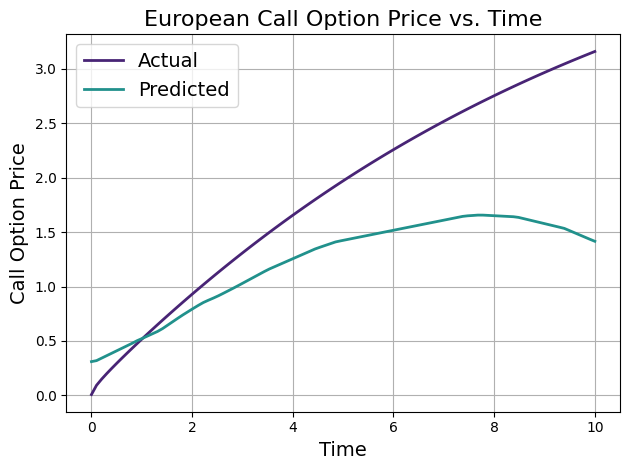

In [21]:
plot_wrt_time(data["net"])

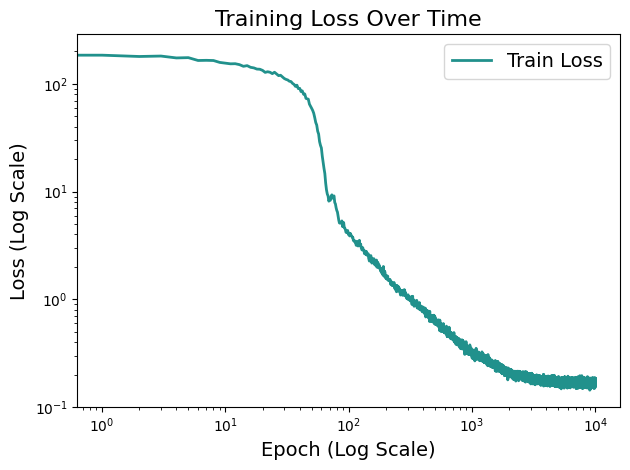

In [22]:
plt.plot(data["monitoring"]["loss_train"], label="Train Loss", color=cm.viridis(0.5), linewidth=2)

# Add title and axis labels with increased font size
plt.title('Training Loss Over Time', fontsize=16)
plt.xlabel('Epoch (Log Scale)', fontsize=14)
plt.ylabel('Loss (Log Scale)', fontsize=14)

# Set the y-axis and x-axis to logarithmic scale
plt.yscale('log')
plt.xscale('log')

# Add a legend with increased font size
plt.legend(fontsize=14)

# Adjust layout to avoid clipping
plt.tight_layout()

# Show the plot
plt.show()

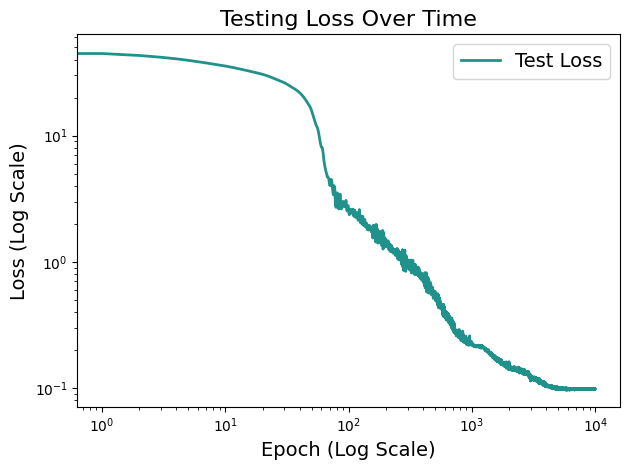

In [23]:
plt.plot(data["monitoring"]["loss_test"][:100000], label="Test Loss", color=cm.viridis(0.5), linewidth=2)

# Add title and axis labels with increased font size
plt.title('Testing Loss Over Time', fontsize=16)
plt.xlabel('Epoch (Log Scale)', fontsize=14)
plt.ylabel('Loss (Log Scale)', fontsize=14)

# Set the y-axis and x-axis to logarithmic scale
plt.yscale('log')
plt.xscale('log')

# Add a legend with increased font size
plt.legend(fontsize=14)

# Adjust layout to avoid clipping
plt.tight_layout()

# Show the plot
plt.show()

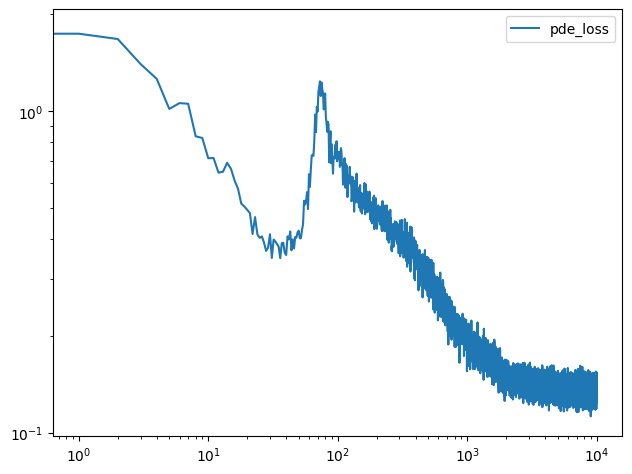

In [24]:
plt.plot(data["monitoring"]["loss_pde"], label="pde_loss")
plt.tight_layout()
plt.legend()
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.xscale('log')
plt.show()

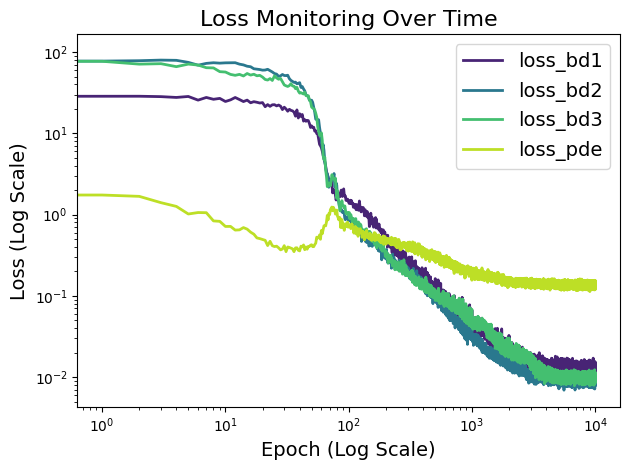

In [25]:
plt.plot(data["monitoring"]["loss_bd1"][:100000], label="loss_bd1", color=cm.viridis(0.1), linewidth=2)
plt.plot(data["monitoring"]["loss_bd2"][:100000], label="loss_bd2", color=cm.viridis(0.4), linewidth=2)
plt.plot(data["monitoring"]["loss_bd3"][:100000], label="loss_bd3", color=cm.viridis(0.7), linewidth=2)
plt.plot(data["monitoring"]["loss_pde"][:100000], label="loss_pde", color=cm.viridis(0.9), linewidth=2)

# Add title and axis labels with increased font size
plt.title('Loss Monitoring Over Time', fontsize=16)
plt.xlabel('Epoch (Log Scale)', fontsize=14)
plt.ylabel('Loss (Log Scale)', fontsize=14)

# Set the y-axis and x-axis to logarithmic scale
plt.yscale('log')
plt.xscale('log')

# Add a legend with increased font size
plt.legend(fontsize=14)

# Adjust layout to avoid clipping
plt.tight_layout()

# Show the plot
plt.show()

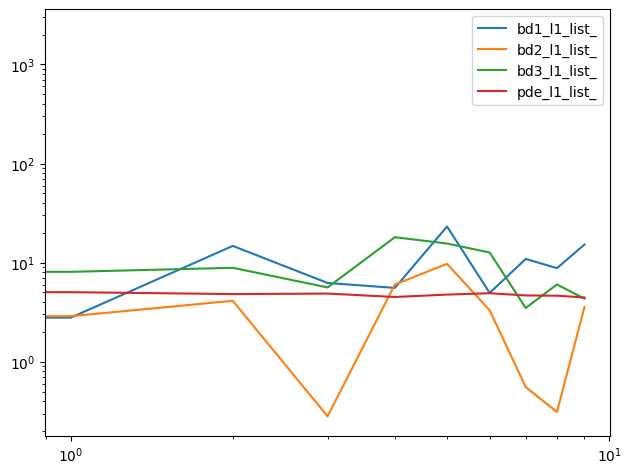

In [ ]:
plt.plot(data["monitoring"]["bd1_l1_list_"], label="bd1_l1_list_")
plt.plot(data["monitoring"]["bd2_l1_list_"], label="bd2_l1_list_")
plt.plot(data["monitoring"]["bd3_l1_list_"], label="bd3_l1_list_")
plt.plot(data["monitoring"]["pde_l1_list_"], label="pde_l1_list_")
plt.tight_layout()
plt.legend()
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.xscale('log')
plt.show()

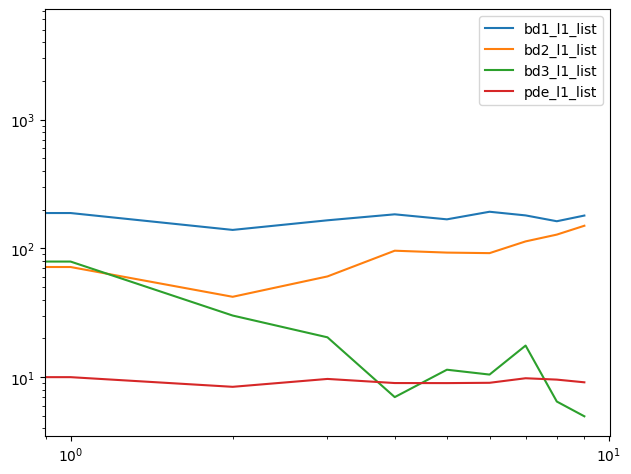

In [279]:
plt.plot(data["monitoring"]["bd1_l1_list"], label="bd1_l1_list")
plt.plot(data["monitoring"]["bd2_l1_list"], label="bd2_l1_list")
plt.plot(data["monitoring"]["bd3_l1_list"], label="bd3_l1_list")
plt.plot(data["monitoring"]["pde_l1_list"], label="pde_l1_list")
plt.tight_layout()
plt.legend()
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.xscale('log')
plt.show()

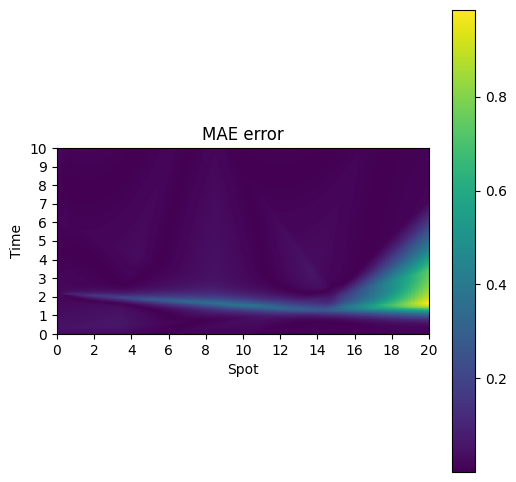

In [236]:

S = 5
K = 5  # Strike price
T = 1 # Time to expiration in years
r = 0.05  # Risk-free interest rate
sigma = 0.1 # Volatility
times = np.linspace(0.001,  10, 100)
spots = np.linspace(1,  20, 100)
call_prices_actual = [[calculate_european_call_price(s, K, t, r, sigma) for t in times] for s in spots]
payouts_actual = calculate_payout(spot_prices, K)
input_features = np.zeros((100, 5))
preds = []
for s in spots:
    input_features[:, 0] = s
    input_features[:, 1] = K
    input_features[:, 2] = times
    input_features[:, 3] = r
    input_features[:, 4] = sigma
    spot_prices_tensor = (torch.Tensor(input_features).reshape(-1, 5).to(device)-scaler_x_tensor_means)/scaler_x_tensor_stds
    with torch.no_grad():
        data["net"].eval()
        # call_prices_predicted = scaler_y.inverse_transform(net(spot_prices_tensor).numpy())
        call_prices_predicted = (data["net"](spot_prices_tensor)* scaler_y_tensor_stds + scaler_y_tensor_means).cpu().numpy()
        preds.append(call_prices_predicted)
preds = np.reshape(np.array(preds),(100,100))
actual = np.array(call_prices_actual)
diff = np.abs(preds-actual)
plt.figure(figsize=(6, 6))
plt.imshow(diff, extent=[0, 20, 0, 10], origin='lower', cmap='viridis')  # Set extent and origin for custom axes
plt.title("MAE error")
plt.colorbar()
plt.xlabel("Spot")
plt.ylabel("Time")
plt.xticks(np.arange(0, 21, 2))  # Customize tick marks for the 'Spot' axis
plt.yticks(np.arange(0, 11, 1))  # Customize tick marks for the 'Time' axis
plt.show()

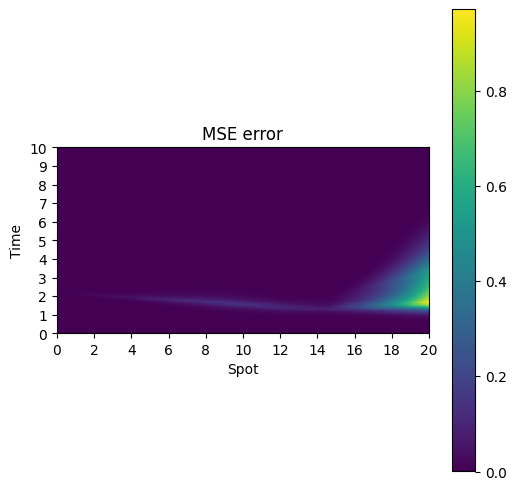

In [237]:
diff = (preds-actual)**2
plt.figure(figsize=(6, 6))
plt.imshow(diff, extent=[0, 20, 0, 10], origin='lower', cmap='viridis')  # Set extent and origin for custom axes
plt.title("MSE error")
plt.colorbar()
plt.xlabel("Spot")
plt.ylabel("Time")
plt.xticks(np.arange(0, 21, 2))  # Customize tick marks for the 'Spot' axis
plt.yticks(np.arange(0, 11, 1))  # Customize tick marks for the 'Time' axis
plt.show()

In [247]:
 
copied_model = ResNetDeep(5,16,depth=6)
copied_model = copied_model
copied_model.load_state_dict(data["net"].state_dict())

<All keys matched successfully>

In [248]:

# works at 0.001 and no generation and max_iter=5
optimizer = torch.optim.LBFGS(copied_model.parameters(), lr=0.001, max_iter=10, max_eval=None, tolerance_grad=1e-07, tolerance_change=1e-09, history_size=500, line_search_fn=None)
criterion = nn.MSELoss()
sample_size = 40120
alpha =0.5
lambda_pde = 1
lambda_bd1 = 1
lambda_bd2 = 1
lambda_bd3 = 1

In [249]:
X_train, Y_train = generate_training_data(sample_size, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)       
X_train_bd1, Y_train_bd1 = generate_training_data_bd1(1000, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)
X_train_bd2, Y_train_bd2 = generate_training_data_bd2(1000, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)
X_train_bd3, Y_train_bd3 = generate_training_data_bd3(1000, (100,300), strike_price_range, expiration_range, interest_rate_range, volatility_range)

X_train_tensor = torch.Tensor(X_train).to(device)
Y_train_tensor_ = torch.Tensor(Y_train).to(device)
X_train_tensor_bd1 = torch.Tensor(X_train_bd1).to(device)
Y_train_tensor_bd1 = torch.Tensor(Y_train_bd1).to(device)
X_train_tensor_bd2 = torch.Tensor(X_train_bd2).to(device)
Y_train_tensor_bd2 = torch.Tensor(Y_train_bd2).to(device)
X_train_tensor_bd3 = torch.Tensor(X_train_bd3).to(device)
Y_train_tensor_bd3 = torch.Tensor(Y_train_bd3).to(device)

In [250]:
def closure():
    optimizer.zero_grad()
   
    
    # optimizer.zero_grad(set_to_none=True)
    X_train_tensor.requires_grad_ = True
    X_train_tensor.requires_grad = True
    X_train_tensor_bd2.requires_grad = True
    
    
    s_ = X_train_tensor[:,0]
    k_ = X_train_tensor[:,1]
    t_ = X_train_tensor[:,2]
    r_ = X_train_tensor[:,3]
    sigma_ = X_train_tensor[:,4]
    
    stack = torch.stack([s_, k_,t_, r_, sigma_], axis=1)

    nn_input = (stack-scaler_x_tensor_means)/scaler_x_tensor_stds
    outputs_unscaled = copied_model(nn_input)
    outputs = outputs_unscaled * scaler_y_tensor_stds + scaler_y_tensor_means
    dVdt = torch.autograd.grad(outputs, t_, grad_outputs=torch.ones_like(outputs), create_graph=True, retain_graph=True)[0]
    dVdS = torch.autograd.grad(outputs, s_, grad_outputs=torch.ones_like(outputs), create_graph=True,retain_graph=True)[0]
    d2Vd2S = torch.autograd.grad(dVdS, s_, grad_outputs=torch.ones_like(dVdS), create_graph=True,retain_graph=True)[0]
    loss_pde = criterion(-dVdt, 0.5*(sigma_**2)*(s_**2)*d2Vd2S + r_*s_*dVdS - r_*outputs.view(-1))

    nn_input_bd1 = (X_train_tensor_bd1-scaler_x_tensor_means)/scaler_x_tensor_stds
    outputs_unscaled_bd1 = copied_model(nn_input_bd1)
    outputs_scaled_bd1 = outputs_unscaled_bd1*scaler_y_tensor_stds+scaler_y_tensor_means
    loss_bd1 = criterion(outputs_scaled_bd1, Y_train_tensor_bd1)

    nn_input_bd2 = (X_train_tensor_bd2-scaler_x_tensor_means)/scaler_x_tensor_stds
    outputs_unscaled_bd2 = copied_model(nn_input_bd2)
    outputs_scaled_bd2 = outputs_unscaled_bd2*scaler_y_tensor_stds+scaler_y_tensor_means
    loss_bd2 = criterion(outputs_scaled_bd2, Y_train_tensor_bd2)
    
    nn_input_bd3 = (X_train_tensor_bd3-scaler_x_tensor_means)/scaler_x_tensor_stds
    outputs_unscaled_bd3 = copied_model(nn_input_bd3)
    outputs_scaled_bd3 = outputs_unscaled_bd3*scaler_y_tensor_stds+scaler_y_tensor_means
    loss_bd3 = criterion(outputs_scaled_bd3, Y_train_tensor_bd3)


    # concat = torch.cat([torch.autograd.grad(loss_pde, p, retain_graph=True)[0].flatten() for p in copied_model.parameters()], dim=0)
    # pde_l2 = torch.linalg.norm(concat, ord=2).detach().item()
    
    # concat = torch.cat([torch.autograd.grad(loss_bd1, p, retain_graph=True)[0].flatten() for p in copied_model.parameters()], dim=0)
    # bd1_l2 = torch.linalg.norm(concat, ord=2).detach().item()

    # concat = torch.cat([torch.autograd.grad(loss_bd2, p, retain_graph=True)[0].flatten() for p in copied_model.parameters()], dim=0)
    # bd2_l2 = torch.linalg.norm(concat, ord=2).detach().item()

    # concat = torch.cat([torch.autograd.grad(loss_bd3, p, retain_graph=True)[0].flatten() for p in copied_model.parameters()], dim=0)
    # bd3_l2 = torch.linalg.norm(concat, ord=2).detach().item()


    # lambda_pde_current = (pde_l2 + bd1_l2 + bd2_l2 + bd3_l2)/(pde_l2+1e-8)
    # lambda_bd1_current = (pde_l2 + bd1_l2 + bd2_l2 + bd3_l2)/(bd1_l2+1e-8)
    # lambda_bd2_current = (pde_l2 + bd1_l2 + bd2_l2 + bd3_l2)/(bd2_l2+1e-8)
    # lambda_bd3_current = (pde_l2 + bd1_l2 + bd2_l2 + bd3_l2)/(bd3_l2+1e-8)

    # lambda_pde = (1-alpha)*1 + alpha*lambda_pde_current
    # lambda_bd1 = (1-alpha)*1 + alpha*lambda_bd1_current
    # lambda_bd2 = (1-alpha)*1 + alpha*lambda_bd2_current
    # lambda_bd3 = (1-alpha)*1 + alpha*lambda_bd3_current
    # loss_og = loss_pde + loss_bd1 + loss_bd2 + loss_bd3
    # print(f"Loss: {loss_og.item()}")
    # print(loss_bd1.item())
    # print(loss_bd2.item())
    # print(loss_bd3.item())
    # print(loss_pde.item())
    # loss_pde = loss_pde*lambda_pde
    # loss_bd1 = loss_bd1*lambda_bd1*1.1
    # loss_bd2 = loss_bd2*lambda_bd2*1.1
    # loss_bd3 = loss_bd3*lambda_bd3*1.1
    data["monitoring"]["loss_train"].append((loss_bd1+loss_bd2+loss_bd3+loss_pde).item())
    data["monitoring"]["loss_bd1"].append(loss_bd1.item())
    data["monitoring"]["loss_bd2"].append(loss_bd2.item())
    data["monitoring"]["loss_bd3"].append(loss_bd3.item())
    data["monitoring"]["loss_pde"].append(loss_pde.item())
    # print(loss_bd1.item())
    # print(loss_bd2.item())
    # print(loss_bd3.item())
    # print(loss_pde.item())
    loss = loss_pde + loss_bd1*20 + loss_bd2*20 + loss_bd3*20

    # loss = loss_pde/0.1448 + loss_bd1/0.000544+ loss_bd2/0.000718 + loss_bd3/0.000858
    loss.backward()
    return loss


In [251]:
EPOCHS_L_BFGS = 500
for i in range(EPOCHS_L_BFGS):
    # X_train_bd1, Y_train_bd1 = generate_training_data_bd1(sample_size, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)
    # X_train_bd2, Y_train_bd2 = generate_training_data_bd2(sample_size, spot_price_range, strike_price_range, expiration_range, interest_rate_range, volatility_range)
    # X_train_bd3, Y_train_bd3 = generate_training_data_bd3(sample_size, (100,300), strike_price_range, expiration_range, interest_rate_range, volatility_range)

    # X_train_tensor = torch.Tensor(X_train).to(device)
    # Y_train_tensor_ = torch.Tensor(Y_train).to(device)
    # X_train_tensor_bd1 = torch.Tensor(X_train_bd1).to(device)
    # Y_train_tensor_bd1 = torch.Tensor(Y_train_bd1).to(device)
    # X_train_tensor_bd2 = torch.Tensor(X_train_bd2).to(device)
    # Y_train_tensor_bd2 = torch.Tensor(Y_train_bd2).to(device)
    # X_train_tensor_bd3 = torch.Tensor(X_train_bd3).to(device)
    # Y_train_tensor_bd3 = torch.Tensor(Y_train_bd3).to(device)
    print(optimizer.step(closure))
    X_test_tensor_ = (X_test_tensor-scaler_x_tensor_means)/scaler_x_tensor_stds
    test_outputs = copied_model(X_test_tensor_)
    test_outputs = test_outputs * scaler_y_tensor_stds + scaler_y_tensor_means

    test_loss = criterion(test_outputs, y_test_tensor)
    data["monitoring"]["loss_test"].append(test_loss.item())
    print("-----------------------")
    print(test_loss.item())

tensor(0.1574, grad_fn=<AddBackward0>)
-----------------------
0.028719134628772736
tensor(0.1597, grad_fn=<AddBackward0>)
-----------------------
0.02871134877204895
tensor(0.1597, grad_fn=<AddBackward0>)
-----------------------
0.028703365474939346
tensor(0.1596, grad_fn=<AddBackward0>)
-----------------------
0.028695203363895416
tensor(0.1596, grad_fn=<AddBackward0>)
-----------------------
0.02868697978556156
tensor(0.1595, grad_fn=<AddBackward0>)
-----------------------
0.02867859974503517
tensor(0.1595, grad_fn=<AddBackward0>)
-----------------------
0.02866986393928528
tensor(0.1595, grad_fn=<AddBackward0>)
-----------------------
0.028660917654633522
tensor(0.1594, grad_fn=<AddBackward0>)
-----------------------
0.028651513159275055
tensor(0.1594, grad_fn=<AddBackward0>)
-----------------------
0.028641780838370323
tensor(0.1593, grad_fn=<AddBackward0>)
-----------------------
0.028631871566176414
tensor(0.1593, grad_fn=<AddBackward0>)
-----------------------
0.028621824458241

KeyboardInterrupt: 

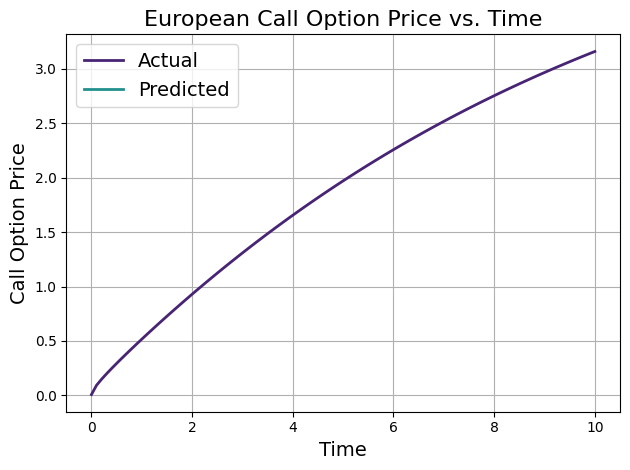

In [243]:
plot_wrt_time(copied_model)

C:\Users\takat\AppData\Local\Temp\ipykernel_1912\4073199059.py:12: RuntimeWarning: divide by zero encountered in log
  d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))


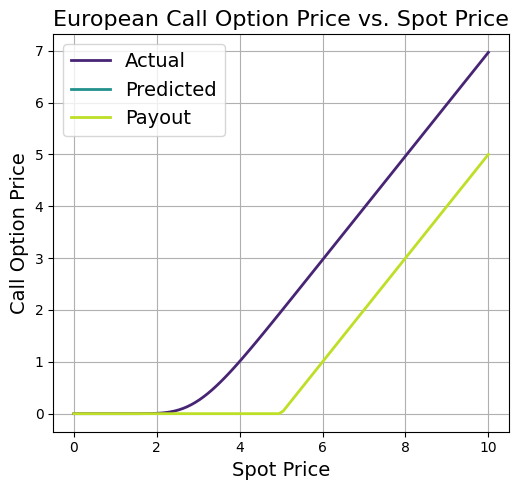

In [244]:
plot_wrt_spot(copied_model)

C:\Users\takat\AppData\Local\Temp\ipykernel_1912\4073199059.py:12: RuntimeWarning: divide by zero encountered in log
  d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))


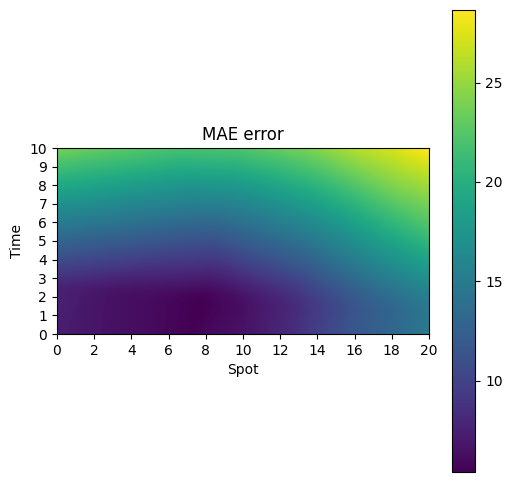

In [245]:

S = 5
K = 5  # Strike price
T = 1 # Time to expiration in years
r = 0.05  # Risk-free interest rate
sigma = 0.1 # Volatility
times = np.linspace(0.001,  10, 100)
spots = np.linspace(0,  20, 100)
call_prices_actual = [[calculate_european_call_price(s, K, t, r, sigma) for t in times] for s in spots]
payouts_actual = calculate_payout(spot_prices, K)
input_features = np.zeros((100, 5))
preds = []
for s in spots:
    input_features[:, 0] = s
    input_features[:, 1] = K
    input_features[:, 2] = times
    input_features[:, 3] = r
    input_features[:, 4] = sigma
    spot_prices_tensor = (torch.Tensor(input_features).reshape(-1, 5).to(device)-scaler_x_tensor_means)/scaler_x_tensor_stds
    with torch.no_grad():
        net.eval()
        # call_prices_predicted = scaler_y.inverse_transform(net(spot_prices_tensor).numpy())
        call_prices_predicted = (net(spot_prices_tensor)* scaler_y_tensor_stds + scaler_y_tensor_means).cpu().numpy()
        preds.append(call_prices_predicted)
preds = np.reshape(np.array(preds),(100,100))
actual = np.array(call_prices_actual)
diff = np.abs(preds-actual)
plt.figure(figsize=(6, 6))
plt.imshow(diff, extent=[0, 20, 0, 10], origin='lower', cmap='viridis')  # Set extent and origin for custom axes
plt.title("MAE error")
plt.colorbar()
plt.xlabel("Spot")
plt.ylabel("Time")
plt.xticks(np.arange(0, 21, 2))  # Customize tick marks for the 'Spot' axis
plt.yticks(np.arange(0, 11, 1))  # Customize tick marks for the 'Time' axis
plt.show()

In [246]:
logs = []
sizes = [16, 32, 64, 128, 256]
for size in sizes:
    net = ResNet(5,size)

    data = train_model(net,epochs=10000, lr_start=0.002, logging=True,
                        sample_size=512, batch_size=512, denom=400,
                        step_size=2000, gamma=0.4, n_domains=1,
                        padding=0.01) 
    logs.append(data)


NameError: name 'ResNet' is not defined

In [ ]:
for i,size in zip(range(len(sizes)), sizes):
    plt.plot(logs[i]["monitoring"]["loss_train"], label=f"train loss {size}")
plt.tight_layout()
plt.legend()
plt.title("Train loss by model size")
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.xscale('log')
plt.show()

In [ ]:
for i,size in zip(range(len(sizes)), sizes):
    plt.plot(logs[i]["monitoring"]["loss_test"], label=f"test loss {size}")
plt.tight_layout()
plt.legend()
plt.title("Test loss by model size")
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.xscale('log')
plt.show()

In [ ]:
logs = []
batchsizes = [256, 512, 1024, 2048]
for batch in batchsizes:
    net = ResNet(5,32)

    data = train_model(net,epochs=10000, lr_start=0.002, logging=True,
                        sample_size=batch, batch_size=batch, denom=400,
                        step_size=2000, gamma=0.4, n_domains=1,
                        padding=0.01) 
    logs.append(data)
for i,size in zip(range(len(batchsizes)), batchsizes):
    plt.plot(logs[i]["monitoring"]["loss_train"], label=f"train loss {size}")
plt.tight_layout()
plt.legend()
plt.title("Train loss by batch size")
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.xscale('log')
plt.show()

In [ ]:
for i,size in zip(range(len(batchsizes)), batchsizes):
    plt.plot(logs[i]["monitoring"]["loss_test"], label=f"test loss {size}")
plt.tight_layout()
plt.legend()
plt.title("Test loss by batch size")
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.xscale('log')
plt.show()

In [ ]:
logs = []
denoms = [512, 1024, 2048, 4096, 8192]
for denom in denoms:
    net = ResNet(5,32)

    data = train_model(net,epochs=10000, lr_start=0.002, logging=True,
                        sample_size=512, batch_size=512, denom=denom,
                        step_size=2000, gamma=0.4, n_domains=1,
                        padding=0.01) 
    logs.append(data)
for i,size in zip(range(len(denoms)), denoms):
    plt.plot(logs[i]["monitoring"]["loss_train"], label=f"train loss {size}")
plt.tight_layout()
plt.legend()
plt.title("Train loss by fi")
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.xscale('log')
plt.show()

In [ ]:
for i,size in zip(range(len(denoms)), denoms):
    plt.plot(logs[i]["monitoring"]["loss_test"], label=f"test loss {size}")
plt.tight_layout()
plt.legend()
plt.title("Test loss by fi")
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.xscale('log')
plt.show()

In [ ]:
logs = []
net = ResNet(5,32)
domains = [1, 2, 4, 8, 16]
for domain in domains:
 
    copied_model = ResNet(5,32)
    # copied_model = copied_model.double()
    copied_model.load_state_dict(data["net"].state_dict())
    data = train_model(copied_model,epochs=10000, lr_start=0.002, logging=True,
                        sample_size=512, batch_size=512, denom=400,
                        step_size=2000, gamma=0.4, n_domains=domain,
                        padding=0.01) 
    logs.append(data)
for i,size in zip(range(len(domains)), domains):
    plt.plot(logs[i]["monitoring"]["loss_train"], label=f"train loss {size}")
plt.tight_layout()
plt.legend()
plt.title("Train loss by domain count")
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.xscale('log')
plt.show()

In [ ]:
for i,size in zip(range(len(domains)), domains):
    plt.plot(logs[i]["monitoring"]["loss_test"], label=f"test loss {size}")
plt.tight_layout()
plt.legend()
plt.title("Train loss by domain count")
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.xscale('log')
plt.show()

In [ ]:
logs = []
depths = [2, 4, 8, 16, 32, 64]
for depth in depths:
    copied_model = ResNetDeep(5,16, depth=depth)
    # copied_model = copied_model.double()
    # copied_model.load_state_dict(data["net"].state_dict())
    data = train_model(copied_model,epochs=10000, lr_start=0.002, logging=True,
                        sample_size=512, batch_size=512, denom=400,
                        step_size=2000, gamma=0.4, n_domains=1,
                        padding=0.01) 
    logs.append(data)
for i,size in zip(range(len(depths)), depths):
    plt.plot(logs[i]["monitoring"]["loss_train"], label=f"train loss {size}")
plt.tight_layout()
plt.legend()
plt.title("Train loss by model depth")
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.xscale('log')
plt.show()

In [ ]:
for i,size in zip(range(len(depths)), depths):
    plt.plot(logs[i]["monitoring"]["loss_test"], label=f"test loss {size}")
plt.tight_layout()
plt.legend()
plt.title("Train loss by depth")
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.xscale('log')
plt.show()

In [280]:
net = ResNetDeep(5,16,depth=4)
test_loss_advanced = []
all_data_advanced = []
for i in range(20):
    copied_model = ResNetDeep(5,16,depth=4)

    copied_model.load_state_dict(net.state_dict())

    data = train_model(copied_model,epochs=20000, lr_start=0.001, logging=True,
                        sample_size=512, batch_size=512, denom=1000,
                        step_size=1000, gamma=0.4**(1/8), n_domains=1,
                        padding=0.1,advanced=True)  
    test_loss_advanced.append(data["monitoring"]["loss_test"][-1])
    all_data_advanced.append(data)

BD1 loss: 173.29483032226562
BD2 loss: 238.8889923095703
BD3 loss: 15.642159461975098
PDE loss: 1.894426703453064
Sum of losses: 429.7204087972641
lambda pde: 236.5791806253826, lambda bd1: 2.3165653674324638, lambda bd2: 2.1822484536816034, lambda bd3: 9.446744828059742
pde_l2: 18.504369735717773, bd1_l2: 1889.75830078125, bd2_l2: 2006.072509765625, bd3_l2: 463.4134521484375
tensor([1.8944], grad_fn=<CopySlices>)
tensor([1.8944], grad_fn=<CumsumBackward0>)
tensor([1.])
------------------------------------------
pde_l2: 2198.126220703125, bd1_l2: 128358.6640625, bd2_l2: 35079.12890625, bd3_l2: 195873.59375
------------------------------------------
Epoch 0/20000, Train Loss: 22784.6855, Test Loss: 100.0533
Excecution took: 0.14264631271362305
Epoch 1/20000, Train Loss: 20645.5898, Test Loss: 88.6446
Excecution took: 0.026523590087890625
Epoch 2/20000, Train Loss: 17343.8691, Test Loss: 78.4505
Excecution took: 0.020996570587158203
Epoch 3/20000, Train Loss: 14817.3496, Test Loss: 69.49

KeyboardInterrupt: 

In [ ]:
test_loss_naive = []
all_data_naive = []
for i in range(20):
    copied_model = ResNetDeep(5,16,depth=4)

    copied_model.load_state_dict(net.state_dict())

    data = train_model(copied_model,epochs=20000, lr_start=0.001, logging=True,
                        sample_size=512, batch_size=512, denom=1000,
                        step_size=1000, gamma=0.4**(1/8), n_domains=1,
                        padding=0.1,advanced=False)
    test_loss_naive.append(data["monitoring"]["loss_test"][-1])
    all_data_naive.append(data)

BD1 loss: 375.98809814453125
BD2 loss: 731.9911499023438
BD3 loss: 199.6226806640625
PDE loss: 1.759548306465149
Sum of losses: 1309.3614770174026
lambda pde: 1061.9652111600294, lambda bd1: 3.1352954126129107, lambda bd2: 2.2841704265512224, lambda bd3: 4.126886337763111
pde_l2: 11.105293273925781, bd1_l2: 3761.5068359375, bd2_l2: 5163.115234375, bd3_l2: 2857.707763671875
tensor([1.7595], grad_fn=<CopySlices>)
tensor([1.7595], grad_fn=<CumsumBackward0>)
tensor([1.])
------------------------------------------
pde_l2: 11.105293273925781, bd1_l2: 3761.5068359375, bd2_l2: 5163.115234375, bd3_l2: 2857.707763671875
------------------------------------------
Epoch 0/5000, Train Loss: 1309.3615, Test Loss: 396.8041
Excecution took: 0.42205190658569336
Epoch 1/5000, Train Loss: 1159.5925, Test Loss: 345.3206
Excecution took: 0.039545536041259766
Epoch 2/5000, Train Loss: 997.1060, Test Loss: 298.7162
Excecution took: 0.03556370735168457
Epoch 3/5000, Train Loss: 887.7645, Test Loss: 256.7486
E

In [ ]:
min(test_loss_naive)

0.049904391169548035

C:\Users\takat\AppData\Local\Temp\ipykernel_28716\1814961429.py:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(test_loss_advanced, label='Advanced', shade=True, color=cm.viridis(0.1))
c:\Users\takat\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\takat\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\takat\AppData\Local\Temp\ipykernel_28716\1814961429.py:9: FutureWarning: 

`shade` is now deprecate

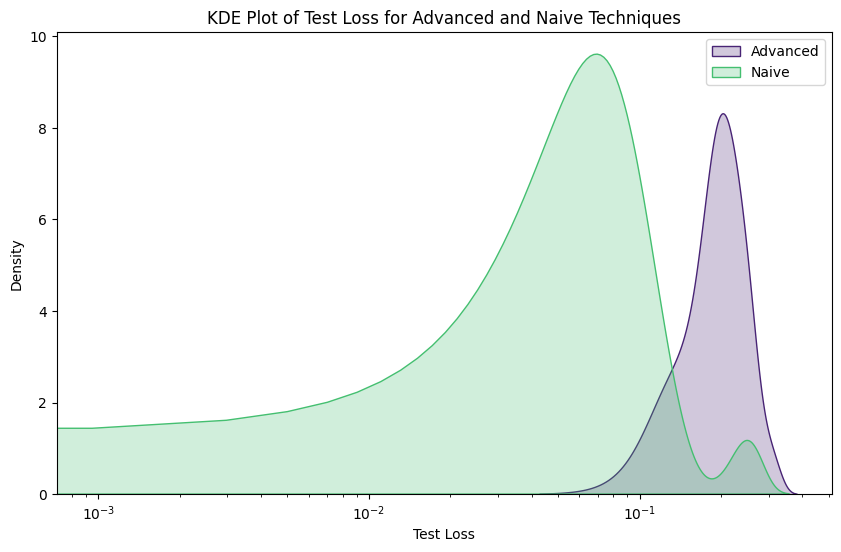

In [ ]:
import seaborn as sns
import matplotlib.cm as cm

sns.set_palette("viridis")

# Create the KDE plot
plt.figure(figsize=(10, 6))
sns.kdeplot(test_loss_advanced, label='Advanced', shade=True, color=cm.viridis(0.1))
sns.kdeplot(test_loss_naive, label='Naive', shade=True,color=cm.viridis(0.7))

# Add labels and title
plt.xlabel('Test Loss')
plt.ylabel('Density')
plt.xscale('log')
plt.title('KDE Plot of Test Loss for Advanced and Naive Techniques')

# Show legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
import matplotlib.cm as cm

plt.figure(figsize=(15, 10))

# Loop through each training run's data for the Naive technique
for i, data in enumerate(all_data_naive):
    plt.plot(data['monitoring']['loss_test'], label=f'Naive Run {i+1}', color=cm.viridis(0.1), alpha=0.5)

# Loop through each training run's data for the Advanced technique
for i, data in enumerate(all_data_advanced):
    plt.plot(data['monitoring']['loss_test'], label=f'Advanced Run {i+1}', color=cm.viridis(0.7), alpha=0.5)

# Add labels, title, and legend
plt.xlabel('Epochs')
plt.ylabedatal('Test Loss')
plt.title('Test Loss Progression for Advanced and Naive Techniques')
plt.legend(loc='upper right', ncol=2)

# Show the plot
plt.show()

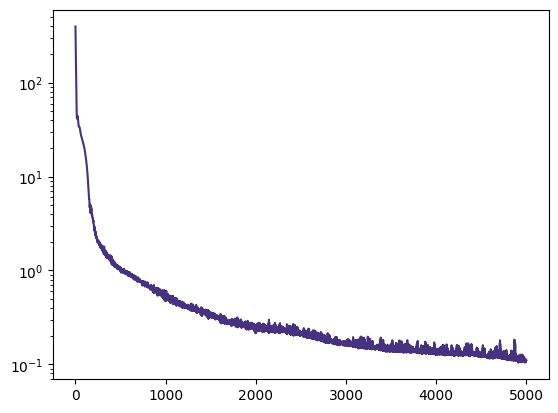

In [ ]:
plt.plot(data['monitoring']['loss_test'])
plt.yscale('log')